In [49]:
import pandas as pd
import numpy as np

In [50]:
df = pd.read_csv('MNIST_train.csv')
df

,label,pixel0,pixel1,pixel2,pixel3,pixel4,pixel5,pixel6,pixel7,pixel8,...,pixel774,pixel775,pixel776,pixel777,pixel778,pixel779,pixel780,pixel781,pixel782,pixel783
0,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,4,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
41995,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
41996,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
41997,7,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
41998,6,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [51]:
# 42000 images
# 1 col for each pixel
df.shape

(42000, 785)

In [52]:
28 * 28

784

In [53]:
df.iloc[18306]

label       8
pixel0      0
pixel1      0
pixel2      0
pixel3      0
           ..
pixel779    0
pixel780    0
pixel781    0
pixel782    0
pixel783    0
Name: 18306, Length: 785, dtype: int64

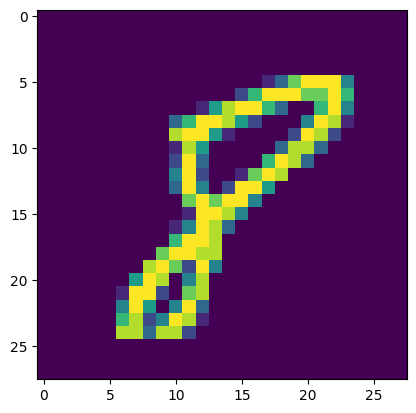

In [54]:
import matplotlib.pyplot as plt

plt.imshow(df.iloc[18306, 1:].values.reshape(28, 28))

### ML Model

In [55]:
X = df.iloc[:, 1:]
y = df.iloc[:, 0]

X.head()

,pixel0,pixel1,pixel2,pixel3,pixel4,pixel5,pixel6,pixel7,pixel8,pixel9,...,pixel774,pixel775,pixel776,pixel777,pixel778,pixel779,pixel780,pixel781,pixel782,pixel783
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [56]:
y.head()

0    1
1    0
2    1
3    4
4    0
Name: label, dtype: int64

In [57]:
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

X_train.shape

(33600, 784)

In [58]:
X_test.shape

(8400, 784)

In [59]:
from sklearn.neighbors import KNeighborsClassifier

knn = KNeighborsClassifier()

knn.fit(X_train, y_train)

KNeighborsClassifier()

In [60]:
# This took some time to calculate, that is why we are using PCA to reduce this time
import time

start = time.time()
y_pred = knn.predict(X_test)
print(time.time() - start)

7.62438440322876


In [61]:
from sklearn.metrics import accuracy_score

accuracy_score(y_test, y_pred)

0.9648809523809524

### PCA model (with less number of cols)

In [62]:
# Step 1 - Standardize the data (Mean centering)
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

In [63]:
# PCA
from sklearn.decomposition import PCA

# None - same principal component number as number of columns
pca = PCA(n_components=None)

X_train_trf = pca.fit_transform(X_train)
X_test_trf = pca.transform(X_test)

In [64]:
# same 784
X_train_trf.shape

(33600, 784)

In [65]:
pca = PCA(n_components=200)

X_train_trf = pca.fit_transform(X_train)
X_test_trf = pca.transform(X_test)
X_train_trf.shape

(33600, 200)

In [66]:
knn = KNeighborsClassifier()

knn.fit(X_train_trf, y_train)

KNeighborsClassifier()

In [67]:
y_pred = knn.predict(X_test_trf)

accuracy_score(y_test, y_pred)

0.9507142857142857

In [72]:
scores = []
for i in range(1, 100):
    pca = PCA(n_components=i)
    X_train_trf = pca.fit_transform(X_train)
    X_test_trf = pca.transform(X_test)

    knn = KNeighborsClassifier()
    knn.fit(X_train_trf, y_train)
    y_pred = knn.predict(X_test_trf)
    score = accuracy_score(y_test, y_pred)
    scores.append(score)
    print("n_components = ", i, " : ", score)

n_components =  1  :  0.2580952380952381
n_components =  2  :  0.3236904761904762
n_components =  3  :  0.5104761904761905
n_components =  4  :  0.6663095238095238
n_components =  5  :  0.7378571428571429
n_components =  6  :  0.8227380952380953
n_components =  7  :  0.8436904761904762
n_components =  8  :  0.8721428571428571
n_components =  9  :  0.886547619047619
n_components =  10  :  0.9055952380952381
n_components =  11  :  0.9116666666666666
n_components =  12  :  0.9184523809523809
n_components =  13  :  0.9276190476190476
n_components =  14  :  0.9351190476190476
n_components =  15  :  0.9384523809523809
n_components =  16  :  0.9379761904761905
n_components =  17  :  0.9407142857142857
n_components =  18  :  0.94
n_components =  19  :  0.9425
n_components =  20  :  0.9442857142857143
n_components =  21  :  0.9438095238095238
n_components =  22  :  0.9441666666666667
n_components =  23  :  0.9442857142857143
n_components =  24  :  0.9457142857142857
n_components =  25  :  0.948

In [73]:
scores

[0.2580952380952381,
 0.3236904761904762,
 0.5104761904761905,
 0.6663095238095238,
 0.7378571428571429,
 0.8227380952380953,
 0.8436904761904762,
 0.8721428571428571,
 0.886547619047619,
 0.9055952380952381,
 0.9116666666666666,
 0.9184523809523809,
 0.9276190476190476,
 0.9351190476190476,
 0.9384523809523809,
 0.9379761904761905,
 0.9407142857142857,
 0.94,
 0.9425,
 0.9442857142857143,
 0.9438095238095238,
 0.9441666666666667,
 0.9442857142857143,
 0.9457142857142857,
 0.9484523809523809,
 0.9479761904761905,
 0.9478571428571428,
 0.9471428571428572,
 0.949047619047619,
 0.9491666666666667,
 0.9507142857142857,
 0.9513095238095238,
 0.95,
 0.9504761904761905,
 0.950952380952381,
 0.9519047619047619,
 0.9517857142857142,
 0.9527380952380953,
 0.9533333333333334,
 0.9528571428571428,
 0.9522619047619048,
 0.9522619047619048,
 0.9523809523809523,
 0.9533333333333334,
 0.9528571428571428,
 0.9530952380952381,
 0.9530952380952381,
 0.9533333333333334,
 0.9527380952380953,
 0.95333333333

## Visualizing the PCA

In [76]:
# transforming to a 2D coordinate system
pca = PCA(n_components=2)
X_train_trf = pca.fit_transform(X_train)
X_test_trf = pca.transform(X_test)

X_train_trf.shape

(33600, 2)

In [77]:
import plotly.express as px

y_train_trf = y_train.astype(str)
fig = px.scatter(x=X_train_trf[:, 0],
                 y=X_train_trf[:, 1],
                 color=y_train_trf,
                 color_discrete_sequence=px.colors.qualitative.G10)
fig.show()

In [85]:
# transforming in 3D
pca = PCA(n_components=3)
X_train_trf = pca.fit_transform(X_train)
X_test_trf = pca.transform(X_test)

In [86]:
X_train_trf

array([[-2.71863253, -0.48982409,  1.1354966 ],
       [-0.67698015, -6.75362491, -2.33590139],
       [-3.03323281,  6.50981624,  7.49182983],
       ...,
       [ 2.14883643,  0.78079444, -0.74738774],
       [ 1.05957006,  0.94767312,  3.94973114],
       [17.70258446,  1.96188185, -4.94352837]])

In [87]:
y_train_trf = y_train.astype(str)
fig = px.scatter_3d(df,
                    x=X_train_trf[:, 0],
                    y=X_train_trf[:, 1],
                    z=X_train_trf[:, 2],
                    color=y_train_trf)
fig.update_layout(margin=dict(l=20, r=20, t=20, b=20))
fig.show()

In [88]:
# These are Eigen Values
# Lambda
pca.explained_variance_

array([40.67111198, 29.17023401, 26.74459621])

In [90]:
# these are 3 axis with 784 eigen vectors
pca.components_

array([[ 0.,  0.,  0., ...,  0.,  0.,  0.],
       [-0., -0., -0., ..., -0., -0., -0.],
       [ 0.,  0.,  0., ...,  0.,  0.,  0.]])

## Finding Optimum number of Principle components

In [89]:
pca.explained_variance_ratio_

array([0.05785192, 0.0414927 , 0.03804239])

In [92]:
# their sum is only 13.7 %
5.78 + 4.14 + 3.8

13.719999999999999

In [93]:
# Then what is the optimum number?
pca = PCA(n_components=None)
X_train_trf = pca.fit_transform(X_train)
X_test_trf = pca.transform(X_test)

pca.explained_variance_.shape

(784,)

In [94]:
pca.components_

array([[ 0.,  0.,  0., ...,  0.,  0.,  0.],
       [-0., -0., -0., ..., -0., -0., -0.],
       [ 0.,  0.,  0., ...,  0.,  0.,  0.],
       ...,
       [-0., -0., -0., ..., -0., -0., -0.],
       [-0., -0., -0., ..., -0., -0., -0.],
       [ 0.,  0.,  0., ...,  0.,  0.,  0.]])

In [96]:
pca.explained_variance_ratio_

array([5.78519225e-02, 4.14926968e-02, 3.80423901e-02, 2.96626277e-02,
       2.58156168e-02, 2.25498018e-02, 1.97306802e-02, 1.77527998e-02,
       1.56865066e-02, 1.43606328e-02, 1.37025484e-02, 1.22725500e-02,
       1.14691200e-02, 1.12302739e-02, 1.05852885e-02, 1.01993106e-02,
       9.57676152e-03, 9.42708817e-03, 9.12489429e-03, 8.90170190e-03,
       8.39940495e-03, 8.20063196e-03, 7.85303229e-03, 7.56739707e-03,
       7.37261022e-03, 7.01884653e-03, 6.97919728e-03, 6.71104483e-03,
       6.39845030e-03, 6.30337291e-03, 6.15350848e-03, 6.02388659e-03,
       5.83673972e-03, 5.78547759e-03, 5.72333148e-03, 5.46399774e-03,
       5.43207369e-03, 5.28172755e-03, 5.13381744e-03, 4.94015474e-03,
       4.87671103e-03, 4.81978768e-03, 4.68204430e-03, 4.59342487e-03,
       4.57660834e-03, 4.49219022e-03, 4.44682221e-03, 4.41540749e-03,
       4.35111936e-03, 4.32032928e-03, 4.21808870e-03, 4.18243127e-03,
       4.07994349e-03, 4.02004913e-03, 3.98335855e-03, 3.94598812e-03,
      

In [97]:
# Cumulative sum
np.cumsum(pca.explained_variance_ratio_)

array([0.05785192, 0.09934462, 0.13738701, 0.16704964, 0.19286525,
       0.21541506, 0.23514574, 0.25289854, 0.26858504, 0.28294568,
       0.29664822, 0.30892077, 0.32038989, 0.33162017, 0.34220546,
       0.35240477, 0.36198153, 0.37140862, 0.38053351, 0.38943521,
       0.39783462, 0.40603525, 0.41388828, 0.42145568, 0.42882829,
       0.43584714, 0.44282633, 0.44953738, 0.45593583, 0.4622392 ,
       0.46839271, 0.4744166 , 0.48025334, 0.48603881, 0.49176214,
       0.49722614, 0.50265822, 0.50793994, 0.51307376, 0.51801392,
       0.52289063, 0.52771041, 0.53239246, 0.53698588, 0.54156249,
       0.54605468, 0.5505015 , 0.55491691, 0.55926803, 0.56358836,
       0.56780645, 0.57198888, 0.57606882, 0.58008887, 0.58407223,
       0.58801822, 0.59188694, 0.59571889, 0.59948441, 0.60322635,
       0.60687487, 0.6104829 , 0.61402176, 0.61750117, 0.62094441,
       0.62432378, 0.62767368, 0.63099377, 0.63426257, 0.63746765,
       0.64065542, 0.64376931, 0.64686564, 0.64992395, 0.65296

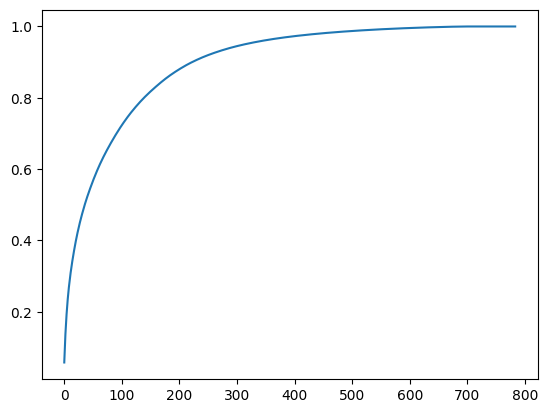

In [98]:
plt.plot(np.cumsum(pca.explained_variance_ratio_))